<a href="https://colab.research.google.com/github/JoelMuhanguzi/computervisionexam/blob/main/computervisionexam.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
#dropbox with entire image folder
#!wget "https://www.dropbox.com/s/haqhji3dxztcxja/Garden%20Crop%20Images-20220909T061134Z-001.zip?dl=0"

!wget "https://www.dropbox.com/s/ws7l8eryjqc7u2p/croped.zip?dl=0"

--2022-09-16 11:29:26--  https://www.dropbox.com/s/ws7l8eryjqc7u2p/croped.zip?dl=0
Resolving www.dropbox.com (www.dropbox.com)... 162.125.65.18, 2620:100:6028:18::a27d:4712
Connecting to www.dropbox.com (www.dropbox.com)|162.125.65.18|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: /s/raw/ws7l8eryjqc7u2p/croped.zip [following]
--2022-09-16 11:29:26--  https://www.dropbox.com/s/raw/ws7l8eryjqc7u2p/croped.zip
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://uc780137b4ffe558248835050df9.dl.dropboxusercontent.com/cd/0/inline/BtCnwyGrulP0z-4_eVVEEX44eZYLhG_IOrmOAWwhDPB9HkXaTNe9KmMFXNAu9Pp3cKpMD97EJdFNcfWmQiTa9Uyd4zvFpVAhUmvjXIfQzoBk4F4qbCAbUDqLaCJb6w2_FnLNOIGjVowXQcrkebmKeWcfYtFY6YD-s_MYI7UUWbUWrg/file# [following]
--2022-09-16 11:29:27--  https://uc780137b4ffe558248835050df9.dl.dropboxusercontent.com/cd/0/inline/BtCnwyGrulP0z-4_eVVEEX44eZYLhG_IOrmOAWwhDPB9HkXaTNe9KmMFXNAu9Pp3cKpMD97EJdFNcf

In [ ]:
!unzip croped.zip

Archive:  croped.zip
   creating: croped/
   creating: croped/banana/
  inflating: croped/banana/frame10.jpg  
  inflating: croped/banana/frame100.jpg  
  inflating: croped/banana/frame108.jpg  
  inflating: croped/banana/frame109.jpg  
  inflating: croped/banana/frame11.jpg  
  inflating: croped/banana/frame110.jpg  
  inflating: croped/banana/frame111.jpg  
  inflating: croped/banana/frame112.jpg  
  inflating: croped/banana/frame113.jpg  
  inflating: croped/banana/frame114.jpg  
  inflating: croped/banana/frame115.jpg  
  inflating: croped/banana/frame116.jpg  
  inflating: croped/banana/frame117.jpg  
  inflating: croped/banana/frame118.jpg  
  inflating: croped/banana/frame119.jpg  
  inflating: croped/banana/frame12.jpg  
  inflating: croped/banana/frame120.jpg  
  inflating: croped/banana/frame121.jpg  
  inflating: croped/banana/frame122.jpg  
  inflating: croped/banana/frame123.jpg  
  inflating: croped/banana/frame124.jpg  
  inflating: croped/banana/frame125.jpg  
  inflati

In [ ]:
!pip install split-folders
import splitfolders
splitfolders.ratio("/content/croped", output="/content/croped_split",
    seed=1337, ratio=(.8, .2), group_prefix=None, move=False)

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


Copying files: 620 files [00:01, 562.66 files/s]


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
from skimage.feature  import hog
import numpy as np
import cv2
import matplotlib.pyplot as plt
from matplotlib import image as mpimg
import os
import glob
from sklearn.neighbors import KNeighborsClassifier
from sklearn import metrics

image:  (932, 1176, 3)


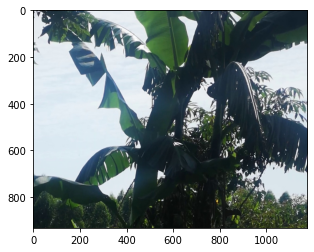

In [ ]:
img = np.array(mpimg.imread('/content/croped/banana/frame10.jpg'))
img.setflags(write=1)
print('image: ', img.shape)
plt.imshow(img)
plt.show()

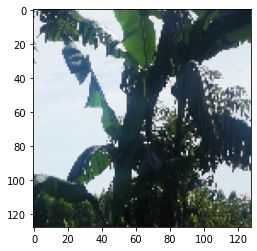

(128, 128, 3)


In [ ]:
resized_img = cv2.resize(img, (128, 128))
plt.imshow(resized_img)
plt.show()
print(resized_img.shape)

(15876,)
[0.23895218 0.03269289 0.         ... 0.0505926  0.04653148 0.06757854]
(128, 128)


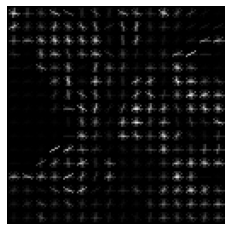

In [ ]:
# COLOR HISTOGRAMS
fd, hog_image = hog(resized_img, visualize=True, multichannel=True)
print(fd.shape)
print(fd)
print(hog_image.shape)
plt.axis("off")
plt.imshow(hog_image, cmap="gray")
plt.show()

In [ ]:
#APPLY COLOR HISTOGRAM TO OTHER IMAGES
train_banana = []

for entry in glob.glob("/content/croped_split/train/banana/*.jpg"):
    img = np.array(mpimg.imread(entry))
    resized_img = cv2.resize(img, (128,128))
    fd = hog(resized_img)
    train_banana.append(fd)

train_cassava = []
for entry in glob.glob("/content/croped_split/train/cassava/*.jpg"):
    img = np.array(mpimg.imread(entry))
    resized_img = cv2.resize(img, (128, 128))
    fd = hog(resized_img)
    train_cassava.append(fd)

train_data = train_banana + train_cassava
print(len(train_data))


495


In [ ]:
print(len(train_banana))

210


In [ ]:
train_label_list = []
for i in range(len(train_data)):
    if i < 210:
      train_label_list.append("banana")
    else:
      train_label_list.append("cassava")

print(train_label_list)
print(len(train_label_list))

['banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana',

In [ ]:
test_banana = []
for entry in glob.glob("/content/croped_split/val/banana/*.jpg"):
    img = np.array(mpimg.imread(entry))
    resized_img = cv2.resize(img, (128, 128))
    fd = hog(resized_img)
    test_dict = {"data":fd, "label": "banana"}
    test_banana.append(test_dict)

test_cassava = []
for entry in glob.glob("/content/croped_split/val/cassava/*.jpg"):
    img = np.array(mpimg.imread(entry))
    resized_img = cv2.resize(img, (128, 128))
    fd = hog(resized_img)
    test_dict = {"data":fd, "label":"cassava"}
    test_cassava.append(test_dict)

test_data = test_banana + test_cassava
print(len(test_data))

125


In [ ]:
test_features = []
test_labels = []

for i in test_data:
    test_labels.append(i['label'])
    test_features.append(i['data'])

print(len(test_features))
print(test_labels)

125
['banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'banana', 'cassava', 'cassava', 'cassava', 'cassava', 'cassava', 'cassava', 'cassava', 'cassava', 'cassava', 'cassava', 'cassava', 'cassava', 'cassava', 'cassava', 'cassava', 'cassava', 'cassava', 'cassava', 'cassava', 'cassava', 'cassava', 'cassava', 'cassava', 'cassava', 'cassava', 'cassava', 'cassava', 'cassava', 'cassava', 'cassava', 'cassava', 'cassava', 'cassava', 'cassava', 'cassava', 'cassava', 'cassava', 'cassava', 'cassava', 'cassava', 'cassava', 'cassava', 'ca

In [ ]:
x_axis_k_points =[]
f1_euclidean = []
accuracies_euclidean = []
conf_matrix_euclidean = []

for k in range(7):
    knn_euclidean = KNeighborsClassifier(n_neighbors=k+1)
    knn_euclidean.fit(train_data, train_label_list)

    pred_labels_euclidean = knn_euclidean.predict(test_features)

    acc_euclidean = knn_euclidean.score(test_features, test_labels)
    accuracies_euclidean.append(acc_euclidean)

    conf_matrix_euclidean.append(metrics.confusion_matrix(test_labels, pred_labels_euclidean))

    f1_euclidean.append(metrics.f1_score(test_labels, pred_labels_euclidean, pos_label='banana'))

    x_axis_k_points.append(k+1)

In [ ]:
f1_manhattan = []
accuracies_manhattan = []
conf_matrix_manhattan = []

for k in range(7):
    knn_manhattan = KNeighborsClassifier(n_neighbors=k+1, p=1)
    knn_manhattan.fit(train_data, train_label_list)

    pred_labels_manhattan = knn_manhattan.predict(test_features)

    acc_manhattan = knn_manhattan.score(test_features, test_labels)
    accuracies_manhattan.append(acc_manhattan)

    conf_matrix_manhattan.append(metrics.confusion_matrix(test_labels, pred_labels_manhattan))

    f1_manhattan.append(metrics.f1_score(test_labels, pred_labels_manhattan, pos_label='banana'))

In [ ]:
for i in range(len(f1_manhattan)):
    print("For K= ", i+1, ", F1 SCORE= ", f1_manhattan[i], ", ACCURACY= ", accuracies_manhattan[i], "\n CONFUSION MATRIX: \n", conf_matrix_manhattan)


For K=  1 , F1 SCORE=  1.0 , ACCURACY=  1.0 
 CONFUSION MATRIX: 
 [array([[53,  0],
       [ 0, 72]]), array([[53,  0],
       [ 0, 72]]), array([[53,  0],
       [ 0, 72]]), array([[53,  0],
       [ 0, 72]]), array([[53,  0],
       [ 0, 72]]), array([[53,  0],
       [ 0, 72]]), array([[53,  0],
       [ 0, 72]])]
For K=  2 , F1 SCORE=  1.0 , ACCURACY=  1.0 
 CONFUSION MATRIX: 
 [array([[53,  0],
       [ 0, 72]]), array([[53,  0],
       [ 0, 72]]), array([[53,  0],
       [ 0, 72]]), array([[53,  0],
       [ 0, 72]]), array([[53,  0],
       [ 0, 72]]), array([[53,  0],
       [ 0, 72]]), array([[53,  0],
       [ 0, 72]])]
For K=  3 , F1 SCORE=  1.0 , ACCURACY=  1.0 
 CONFUSION MATRIX: 
 [array([[53,  0],
       [ 0, 72]]), array([[53,  0],
       [ 0, 72]]), array([[53,  0],
       [ 0, 72]]), array([[53,  0],
       [ 0, 72]]), array([[53,  0],
       [ 0, 72]]), array([[53,  0],
       [ 0, 72]]), array([[53,  0],
       [ 0, 72]])]
For K=  4 , F1 SCORE=  1.0 , ACCURACY=  1.0

In [ ]:
for i in range(len(f1_euclidean)):
    print("FOR K= ", i+1, ", F1 SCORE= ", f1_euclidean[i], ", ACCURACY= ", accuracies_euclidean[i], ", \n CONFUSION MATRIX: \n", conf_matrix_euclidean )

FOR K=  1 , F1 SCORE=  1.0 , ACCURACY=  1.0 , 
 CONFUSION MATRIX: 
 [array([[53,  0],
       [ 0, 72]]), array([[53,  0],
       [ 0, 72]]), array([[53,  0],
       [ 0, 72]]), array([[53,  0],
       [ 0, 72]]), array([[53,  0],
       [ 0, 72]]), array([[53,  0],
       [ 0, 72]]), array([[53,  0],
       [ 0, 72]])]
FOR K=  2 , F1 SCORE=  1.0 , ACCURACY=  1.0 , 
 CONFUSION MATRIX: 
 [array([[53,  0],
       [ 0, 72]]), array([[53,  0],
       [ 0, 72]]), array([[53,  0],
       [ 0, 72]]), array([[53,  0],
       [ 0, 72]]), array([[53,  0],
       [ 0, 72]]), array([[53,  0],
       [ 0, 72]]), array([[53,  0],
       [ 0, 72]])]
FOR K=  3 , F1 SCORE=  1.0 , ACCURACY=  1.0 , 
 CONFUSION MATRIX: 
 [array([[53,  0],
       [ 0, 72]]), array([[53,  0],
       [ 0, 72]]), array([[53,  0],
       [ 0, 72]]), array([[53,  0],
       [ 0, 72]]), array([[53,  0],
       [ 0, 72]]), array([[53,  0],
       [ 0, 72]]), array([[53,  0],
       [ 0, 72]])]
FOR K=  4 , F1 SCORE=  1.0 , ACCURACY

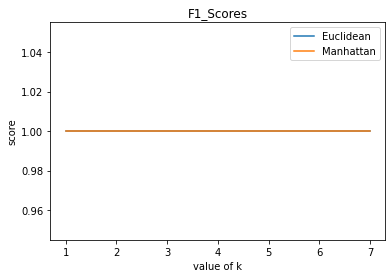

In [ ]:
#ACCURACY REMAINED AS 1 FOR DIFFERENT VALUES OF K, F1 SCORE COMBINES ACCURACY AND PRECISION
plt.plot(x_axis_k_points, f1_euclidean, label="Euclidean")
plt.plot(x_axis_k_points, f1_manhattan, label="Manhattan")
plt.title("F1_Scores")
plt.xlabel("value of k")
plt.ylabel("score")
plt.legend()
plt.show()

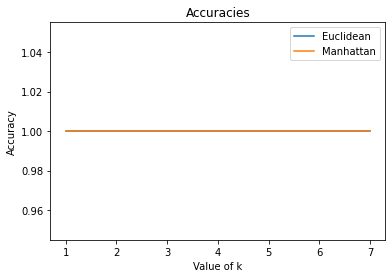

In [ ]:
plt.plot(x_axis_k_points, accuracies_euclidean, label='Euclidean')
plt.plot(x_axis_k_points, accuracies_manhattan, label="Manhattan")
plt.title("Accuracies")
plt.xlabel("Value of k")
plt.ylabel("Accuracy")
plt.legend()
plt.show()
#THE MODEL OVERFITS ON THE FEATURES BECAUSE THE IMAGES ARE LITERALLY THE SAME

In [ ]:
# clone YOLOv5 repository
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
!git reset --hard fbe67e465375231474a2ad80a4389efc77ecff99

Cloning into 'yolov5'...
remote: Enumerating objects: 12351, done.
remote: Counting objects: 100% (59/59), done.
remote: Compressing objects: 100% (44/44), done.
remote: Total 12351 (delta 24), reused 31 (delta 15), pack-reused 12292
Receiving objects: 100% (12351/12351), 12.69 MiB | 14.45 MiB/s, done.
Resolving deltas: 100% (8493/8493), done.
/content/yolov5
HEAD is now at fbe67e4 Fix `OMP_NUM_THREADS=1` for macOS (#8624)


In [ ]:
# install dependencies as necessary
!pip install -qr requirements.txt  # install dependencies (ignore errors)
import torch

from IPython.display import Image, clear_output  # to display images
from utils.downloads import attempt_download  # to download models/datasets

# clear_output()
print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

     |████████████████████████████████| 1.6 MB 16.1 MB/s 
Setup complete. Using torch 1.12.1+cu113 _CudaDeviceProperties(name='Tesla T4', major=7, minor=5, total_memory=15109MB, multi_processor_count=40)


In [ ]:
!pip install roboflow

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 145 kB 13.8 MB/s 
     |████████████████████████████████| 178 kB 61.4 MB/s 
     |████████████████████████████████| 1.1 MB 57.2 MB/s 
     |████████████████████████████████| 67 kB 6.6 MB/s 
     |████████████████████████████████| 54 kB 2.8 MB/s 
     |████████████████████████████████| 138 kB 65.0 MB/s 
     |████████████████████████████████| 62 kB 1.6 MB/s 
  Created wheel for roboflow: filename=roboflow-0.2.15-py3-none-any.whl size=24936 sha256=64bf7e64ed50dda7ddcd9ec3876c1a8173f1833056404dd99d53a076f9a71e9e
  Stored in directory: /root/.cache/pip/wheels/13/e0/a3/fe183fffc3972cb9264e800763d4bbfff80d5309137c410217
  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9675 sha256=b4bca763bf1a6631f6af42b7a86b98a8faa460d40854d083d4b011dc0c75c833
  Stored in directory: /root/.cache/pip/wheels/a1/b6/7c/0e63e34eb06634181c63adacca38b79ff8f35c37

In [ ]:
%cd /content/yolov5

from roboflow import Roboflow
rf = Roboflow(api_key="IEfvmrElQu4XZLLZAiWy")
project = rf.workspace("eyerec").project("tiba")
dataset = project.version(1).download("yolov5")

/content/yolov5
loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to tiba-1 in yolov5pytorch:: 100%|██████████| 1252/1252 [00:00<00:00, 1554.63it/s]


In [ ]:
# this is the YAML file Roboflow wrote for us that we're loading into this notebook with our data
%cat {dataset.location}/data.yaml

names:
- banana
- cassava
nc: 2
train: tiba-1/train/images
val: tiba-1/valid/images


In [ ]:
# define number of classes based on YAML
import yaml
with open(dataset.location + "/data.yaml", 'r') as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])

In [ ]:
#this is the model configuration we will use for our tutorial 
%cat /content/yolov5/models/yolov5s.yaml

# YOLOv5 🚀 by Ultralytics, GPL-3.0 license

# Parameters
nc: 80  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]]

In [ ]:
#customize iPython writefile so we can write variables
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))

In [ ]:
%%writetemplate /content/yolov5/models/custom_yolov5s.yaml

# parameters
nc: {num_classes}  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, BottleneckCSP, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, BottleneckCSP, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, BottleneckCSP, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, BottleneckCSP, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, BottleneckCSP, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, BottleneckCSP, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, BottleneckCSP, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, BottleneckCSP, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

In [ ]:
# train yolov5s on custom data for 100 epochs
# time its performance
%%time
%cd /content/yolov5/
!python train.py --img 416 --batch 16 --epochs 100 --data {dataset.location}/data.yaml --cfg ./models/custom_yolov5s.yaml --weights '' --name yolov5s_results  --cache

/content/yolov5
train: weights=, cfg=./models/custom_yolov5s.yaml, data=/content/yolov5/tiba-1/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=100, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=yolov5s_results, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: ⚠️ YOLOv5 is out of date by 215 commits. Use `git pull` or `git clone https://github.com/ultralytics/yolov5` to update.
YOLOv5 🚀 v6.1-306-gfbe67e4 Python-3.7.14 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=

In [ ]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

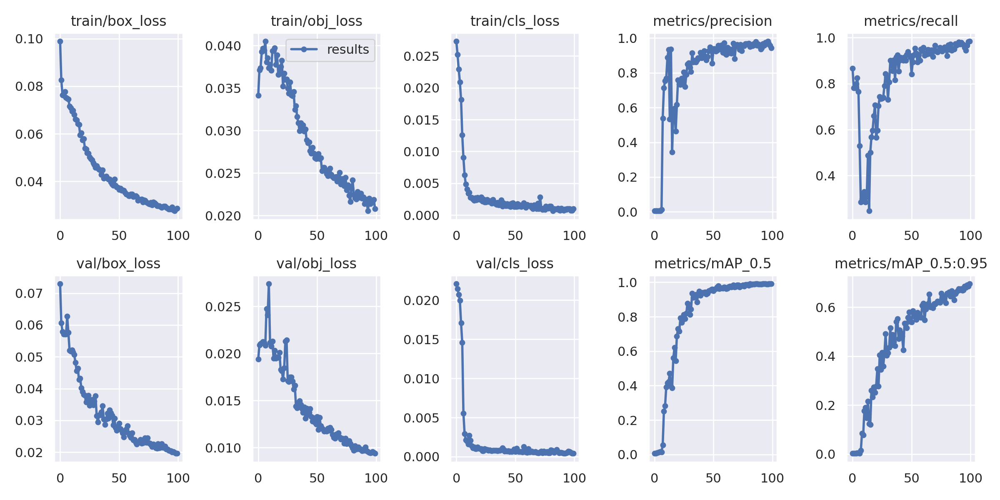

In [ ]:
# we can also output some older school graphs if the tensor board isn't working for whatever reason... 
from IPython.display import Image
from utils.plots import plot_results  # plot results.txt as results.png
Image(filename='/content/yolov5/runs/train/yolov5s_results/results.png', width=1000)  # view results.png

GROUND TRUTH TRAINING DATA:


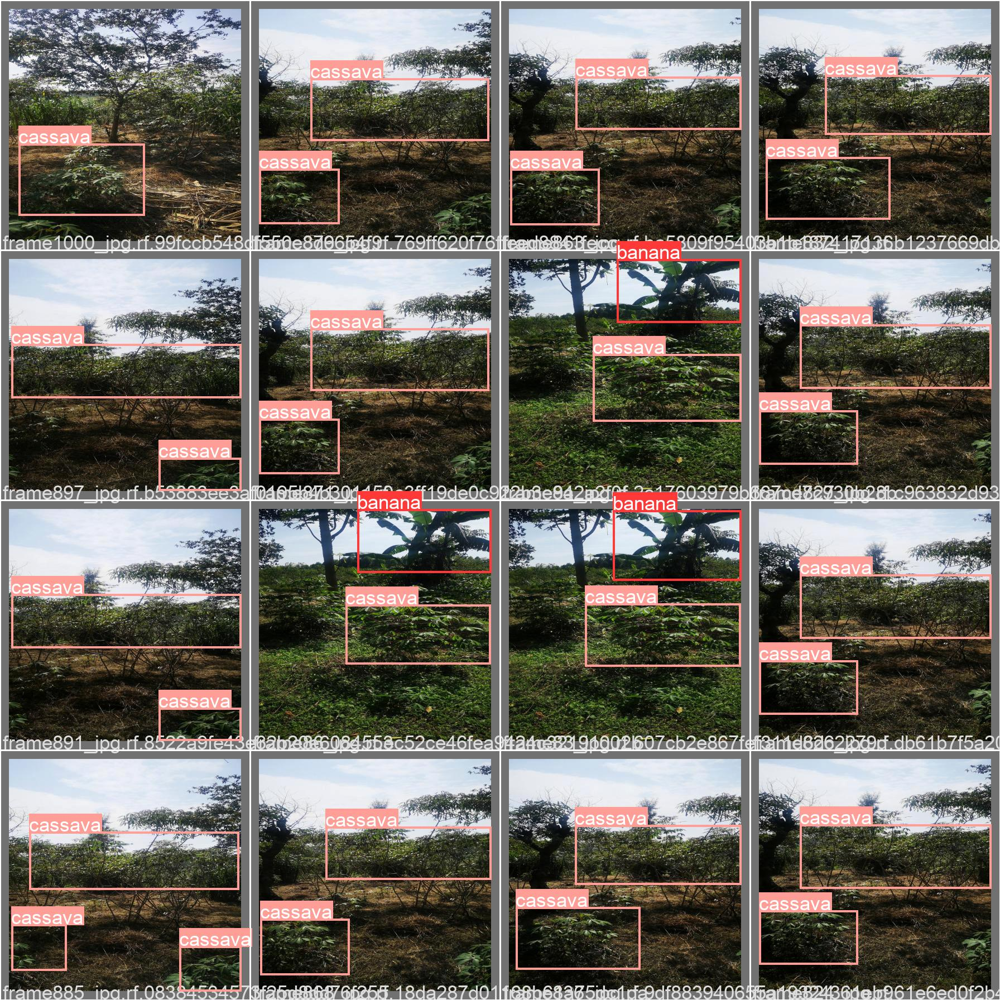

In [ ]:
# first, display our ground truth data
print("GROUND TRUTH TRAINING DATA:")
Image(filename='/content/yolov5/runs/train/yolov5s_results/val_batch0_labels.jpg', width=900)

GROUND TRUTH AUGMENTED TRAINING DATA:


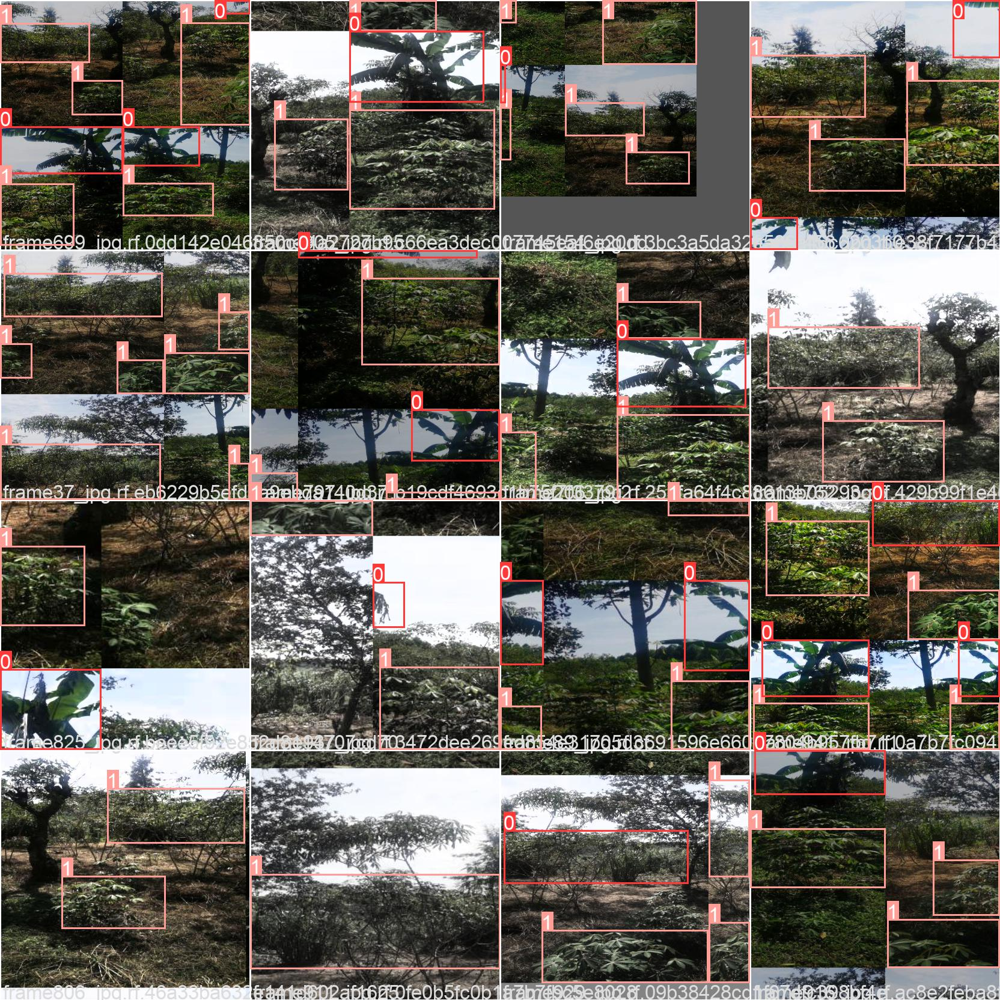

In [ ]:
# print out an augmented training example
print("GROUND TRUTH AUGMENTED TRAINING DATA:")
Image(filename='/content/yolov5/runs/train/yolov5s_results/train_batch0.jpg', width=900)
# 0 - banana 1- cassava

In [ ]:
%cp /content/yolov5/runs/train/yolov5s_results/weights/best.pt /content/drive/My\ Drive

In [ ]:
!zip -r /content/file.zip /content/yolov5/runs/train

  adding: content/yolov5/runs/train/ (stored 0%)
  adding: content/yolov5/runs/train/yolov5s_results/ (stored 0%)
  adding: content/yolov5/runs/train/yolov5s_results/R_curve.png (deflated 14%)
  adding: content/yolov5/runs/train/yolov5s_results/confusion_matrix.png (deflated 34%)
  adding: content/yolov5/runs/train/yolov5s_results/val_batch0_labels.jpg (deflated 4%)
  adding: content/yolov5/runs/train/yolov5s_results/val_batch1_pred.jpg (deflated 3%)
  adding: content/yolov5/runs/train/yolov5s_results/hyp.yaml (deflated 45%)
  adding: content/yolov5/runs/train/yolov5s_results/opt.yaml (deflated 44%)
  adding: content/yolov5/runs/train/yolov5s_results/val_batch1_labels.jpg (deflated 4%)
  adding: content/yolov5/runs/train/yolov5s_results/train_batch2.jpg (deflated 0%)
  adding: content/yolov5/runs/train/yolov5s_results/val_batch0_pred.jpg (deflated 4%)
  adding: content/yolov5/runs/train/yolov5s_results/train_batch0.jpg (deflated 0%)
  adding: content/yolov5/runs/train/yolov5s_results/v